In [28]:
import numpy as np
#
import plotly
plotly.offline.init_notebook_mode()
import plotly.graph_objs as go
from plotly.offline import download_plotlyjs, init_notebook_mode, iplot
from plotly.tools import FigureFactory as FF
#
import scipy.signal as signal
import scipy as sp
from scipy.interpolate import interp1d
from keras.utils import np_utils
import pandas as pd
from sklearn.metrics import roc_curve, auc
import matplotlib.pyplot as plt
import tensorflow as tf
from keras.models import model_from_json
from keras import backend as K
import theano
%matplotlib inline
from sklearn.metrics import confusion_matrix
import itertools
import random
import lifelines
from lifelines import KaplanMeierFitter

# FUNCS

In [29]:
def plot_confusion_matrix(cm, classes,
                          normalize=False,
                          title='Confusion matrix',
                          cmap=plt.cm.Blues):
    """
    This function prints and plots the confusion matrix.
    Normalization can be applied by setting `normalize=True`.
    """
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)

    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Normalized confusion matrix")
    else:
        print('Confusion matrix, without normalization')

    print(cm)

    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, cm[i, j],
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")

    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label')
    
    
def getCM(true,logitsa,cutOff):
    pred = []
    for i in range(logitsa.shape[0]):
        # if firt term is greater than threshold
        if logitsa[i][0] > cutOff:
            pred.append(0)
        elif logitsa[i][0] < cutOff:
            pred.append(1)
        else:
            print"wtf-got logit equal to cutOff"

    print "prediction length: " , len(pred)
    print "predicted 0's : " , len([x for x in pred if x == 0])
    print "predicted 1's : " , len([x for x in pred if x == 1])

    return confusion_matrix(true, pred)

def getSmooth(myX,myY,smooth):
    # BUTTER
    # GET THE WINDOW
    b, a = signal.butter(3, smooth, analog=False, btype = 'lowpass' , output='ba')
    fitData = signal.filtfilt(b,a,myY)

    # EXTRA STEP NEEDED TO SMOOTH - interpolate (this gives a function)
    f2 = interp1d(myX, fitData, kind='cubic')

    # MAKE A NEW X DOMAIN
    newX = np.linspace(0,len(myX)-1,len(myX))

    return newX, f2(newX)

def getTwoLines(metricList,mul, name,smooth,color1,color2):
    scatter1 = go.Scatter( x=np.arange(len(metricList)), y=[k-mul for k in metricList], 
                          showlegend=False ,line=dict(color=color1,width=1) )
    #
    newX,newY = getSmooth(np.arange(len(metricList)),[k-mul for k in metricList],smooth)
    scatter2 = go.Scatter( x=np.arange(len(newX)-1), y=[k for k in newY], name = name,
                         line=dict(color=color2,width=2))
    #
    return scatter1,scatter2

def getOneLines(metricList,mul, name,smooth,color1,color2):
    scatter1 = go.Scatter( x=np.arange(len(metricList)), y=[k-mul for k in metricList],name = name, 
                          showlegend=True ,line=dict(color=color1,width=1) )

    return scatter1

def AUC(test_labels,test_prediction):
    n_classes = 2
    # http://scikit-learn.org/stable/auto_examples/model_selection/plot_roc.html#sphx-glr-auto-examples-model-selection-plot-roc-py
    # Compute ROC curve and ROC area for each class
    fpr = dict()
    tpr = dict()
    roc_auc = dict()
    for i in range(n_classes):
        # ( actual labels, predicted probabilities )
        fpr[i], tpr[i], _ = roc_curve(test_labels[:, i], test_prediction[:, i]) 
        roc_auc[i] = auc(fpr[i], tpr[i])

    return round(roc_auc[0],3) , round(roc_auc[1],3) , fpr[1] , tpr[1] ,_


def manageDataFrames():
    trainList = ["nsclc_rt"]  # , , , ,  ,"oncopanel" , "moffitt","moffittSpore"  ,"oncomap" , ,"lung3" 
    validateList = ["lung1"] # leave empty
    testList = ["lung2"] # split to val and test

    dataFrame = pd.DataFrame.from_csv('master_170228.csv', index_col = 0)
    dataFrame = dataFrame [ 
        ( pd.notnull( dataFrame["pathToData"] ) ) &
        ( pd.notnull( dataFrame["pathToMask"] ) ) &
        ( pd.notnull( dataFrame["stackMin"] ) ) &
        ( pd.isnull( dataFrame["patch_failed"] ) ) &
        # ( pd.notnull( dataFrame["surv1yr"] ) )  &
        ( pd.notnull( dataFrame["surv2yr"] ) )  &
        ( pd.notnull( dataFrame["histology_grouped"] ) )  &
        ( pd.notnull( dataFrame["stage"] ) ) 
        # ( pd.notnull( dataFrame["age"] ) )  
        ]
   
    dataFrame = dataFrame.reset_index(drop=True)
    
    ###### FIX ALL
    
    #1# clean histology - remove smallcell and other
    # histToInclude - only NSCLC
    histToInclude = [1.0,2.0,3.0,4.0]
    # not included - SCLC and other and no data [ 0,5,6,7,8,9 ]
    dataFrame = dataFrame [ dataFrame.histology_grouped.isin(histToInclude) ]
    dataFrame = dataFrame.reset_index(drop=True)

    
    #2# use 1,2,3 stages
    stageToInclude = [2.0,3.0]
    dataFrame = dataFrame [ dataFrame.stage.isin(stageToInclude) ]
    dataFrame = dataFrame.reset_index(drop=True)
    print ("all patients: " , dataFrame.shape)

        
    ###### GET TRAINING / VALIDATION 

    dataFrameTrain = dataFrame [ dataFrame["dataset"].isin(trainList) ]
    #3# type of treatment - use only radio or chemoRadio - use .npy file
    chemoRadio = np.load("rt_chemoRadio.npy").astype(str)
    dataFrameTrain = dataFrameTrain [ dataFrameTrain["patient"].isin(chemoRadio) ]
    #4# (rt only) use all causes of death
    # not implemented
    dataFrameTrain = dataFrameTrain.reset_index(drop=True)
    print ("train patients " , dataFrameTrain.shape)

    dataFrameValidate = dataFrame [ dataFrame["dataset"].isin(validateList) ]
    dataFrameValidate = dataFrameValidate.reset_index(drop=True)
    print ("validate patients : " , dataFrameValidate.shape)


    # TEST
    dataFrameTest = dataFrame [ dataFrame["dataset"].isin(testList) ]
    dataFrameTest = dataFrameTest.reset_index(drop=True)
    print ("final - test size : " , dataFrameTest.shape)

    

    return dataFrameTrain,dataFrameValidate,dataFrameTest



In [30]:
dataFrameTrain,dataFrameValidate,dataFrameTest = manageDataFrames()
print len([ x for x in dataFrameTrain.surv2yr.tolist() if x == 0.0])
print len([ x for x in dataFrameTrain.surv2yr.tolist() if x == 1.0])

('all patients: ', (683, 32))
('train patients ', (191, 32))
('validate patients : ', (81, 32))
('final - test size : ', (98, 32))
98
93


# GET FILES

In [45]:
run = "61"
trainLoss = np.load("/home/ahmed/Dropbox/DFCI/11_AWS_output/output/"+ run + "_train_loss.npy")
validationAucs = np.load("/home/ahmed/Dropbox/DFCI/11_AWS_output/output/"+ run + "_auc.npy")
validationLogits = np.load("/home/ahmed/Dropbox/DFCI/11_AWS_output/output/"+ run + "_logits.npy")



# validationLoss = np.load("/home/ahmed/Dropbox/DFCI/11_AWS_output/output/"+ run + "_val_loss.npy")
# validationLogits = np.load("/home/ahmed/Dropbox/DFCI/11_AWS_output/output/"+ run + "_validation_logits.npy")
# validationLogitsRaw = np.load("/home/ahmed/Dropbox/DFCI/11_AWS_output/output/"+ run + "_validation_logits_raw.npy")

# print len(trainLoss),len(validationLoss),len(validationAucs),len(validationLogits), len(validationLogitsRaw)
print max(validationAucs), np.argmax(validationAucs)
print len(trainLoss) # , len(validationLoss) 


0.835 1997
2943


# PLOT LOSSES AND VALIDATION AUC - ACROSS EPOCHS

In [46]:
smooth = 0.05
# sc1,sc2 = getTwoLines( trainLoss,0, "auc on validation set", smooth,'rgb(166,206,227)', 'rgb(31,120,180)' )
# # sc5,sc6 = getTwoLines( validationLoss ,0, "validation loss", smooth,'rgb(253,191,111)','rgb(255,127,0)')

# # sc3,sc4 = getOneLines( trainLoss,0, "training loss", smooth,'rgb(178,223,138)','rgb(51,160,44)')
# sc5,sc6 = getOneLines( validationLoss,0, "validation auc", smooth,'rgb(253,191,111)','rgb(255,127,0)')

sc3 = getOneLines( trainLoss,0, "training loss", smooth,'rgb(178,223,138)','rgb(51,160,44)')
# sc4 = getOneLines( validationLoss,0, "validation loss", smooth,'rgb(253,191,111)','rgb(255,127,0)')
sc5 = getOneLines( validationAucs,0, "validation auc", smooth,'rgb(166,206,227)', 'rgb(31,120,180)' )


data = [ sc3,sc5 ] 


layout = go.Layout(
    title = "run # " + run ,
    xaxis=dict(
        showgrid=True,
        zeroline=True,
        showline=True,
        showticklabels=True,
        title="epochs"
      
    ),
    yaxis=dict(
        showgrid=True,
        zeroline=True,
        showline=True,
        showticklabels=True,
        title="value",
        range=[0.0,5.0]
    ),
    autosize=True,
    showlegend=True,
)

fig = go.Figure(data=data, layout=layout)
iplot(fig, filename="run # " + run   ) # , , image='svg'   

# PLOT (VALIDATION AND TEST) ROC CURVE

## get dataframes

In [79]:
dataFrameTrain,dataFrameValidate,dataFrameTest= manageDataFrames()

('train patients ', (83, 32))
('validate patients : ', (21, 32))
('test size : ', (117, 32))


In [10]:
len( [ x for x in dataFrameValidate.surv2yr.tolist() if x == 0.0 ]  )

15

## VALIDATION: AT HIGHEST AUC

In [9]:
validationLabelsSingle = dataFrameValidate.surv2yr.tolist()
validationLabels = np_utils.to_categorical(validationLabelsSingle, 2)

print "validation labels: " ,validationLabels.shape
print "validation logits: " ,validationLogits[np.argmax(validationAucs)].shape

# validation
validation_auc1 , validation_auc2 , validation_fpr , validation_tpr , thresh =  AUC(validationLabels,
                                                                                    validationLogits[np.argmax(validationAucs)])

print validation_auc1,validation_auc2,len(validation_fpr),len(validation_tpr)
# should match -
print max(validationAucs), np.argmax(validationAucs)



NameError: name 'dataFrameValidate' is not defined

## TEST : ONLY ONE AUC

In [77]:
# we didnt get this one, get it now
testLogits = np.load("/home/ahmed/Dropbox/DFCI/11_AWS_output/output/"+ run + "_test_logits.npy")

testLabelsSingle = dataFrameTest.surv2yr.tolist()
testLabels = np_utils.to_categorical(testLabelsSingle, 2)
print "test labels: " ,testLabels.shape
print "test logits: " ,testLogits.shape

# validation
test_auc1 , test_auc2 , test_fpr , test_tpr , thresh =  AUC(testLabels, testLogits)
print test_auc1,test_auc2,len(test_fpr),len(test_tpr)


test labels:  (293, 2)
test logits:  (293, 2)
0.495 0.495 141 141


In [80]:
#### we didnt get this one, get it now
testLogits = np.load("/home/ahmed/Dropbox/DFCI/11_AWS_output/output/"+ run + "_test_logits.npy")

testLabelsSingle = dataFrameTest.surv2yr.tolist()
testLabels = np_utils.to_categorical(testLabelsSingle, 2)
print "test labels: " ,testLabels.shape
print "test logits: " ,testLogits.shape

# validation
test_auc1 , test_auc2 , test_fpr_1 , test_tpr_1 , thresh =  AUC(testLabels, testLogits)
print test_auc1,test_auc2,len(test_fpr),len(test_tpr)


test labels:  (117, 2)
test logits:  (117, 2)
0.505 0.505 141 141


## NOW PLOT BOTH

In [81]:
data = []
xs = [validation_fpr , test_fpr , test_fpr_1] # 
ys = [validation_tpr, test_tpr , test_tpr_1] #  
names = ['validation: ' + str(round(auc(validation_fpr,validation_tpr),3))  
        , 'test-rt: ' + str(round(auc(test_fpr,test_tpr),3)) , 'test-lung1: ' + str(round(auc(test_fpr_1,test_tpr_1),3)) ]

for i in range(len(xs)):
    trace = go.Scatter(
        x = xs[i],
        y = ys[i],
        name = names[i],
         line = dict(width = 1)
    )
    data.append(trace)
    

layout = dict(title = 'ROC ',
              xaxis = dict(title = 'false positive rate',range=[0,1]),
              yaxis = dict(title = 'true positive rate',range=[0,1]),
              showlegend=True,
              width=800,
              height=750,
               shapes= [  {
            'type': 'line',
            'x0': 0,
            'y0': 0,
            'x1': 1,
            'y1': 1,
            'line': {
                'color': 'rgb(0, 0, 0)',
                'width': 2,
                'dash': 'dot'
            },
        } ],
              )

fig = dict(data=data, layout=layout)

# Plot and embed in ipython notebook!
iplot(fig, filename='basic-line' , image='svg' ) #  , 

# PLOT KM

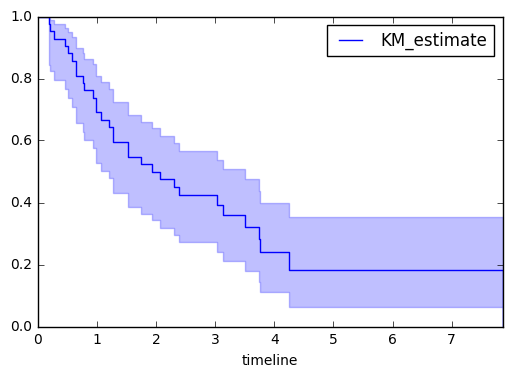

In [240]:
kmf = KaplanMeierFitter()

T = dataFrameValidate.survival
C = dataFrameValidate.deadstat

kmf.fit(T, event_observed=C )

kmf.plot()

In [24]:
kmf.median_

1.9726027397299999

# PLOT (VALIDATION AND TEST) CONFUSION MATRIX

prediction length:  42
predicted 0's :  28
predicted 1's :  14
Confusion matrix, without normalization
[[19  2]
 [ 9 12]]


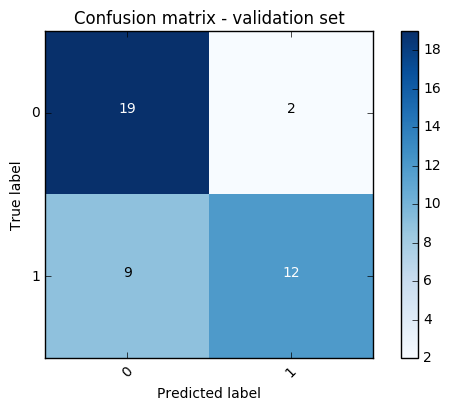

In [255]:
cutOff = 0.5
valCM = getCM(validationLabelsSingle,validationLogits[np.argmax(validationAucs)],cutOff)

plot_confusion_matrix(valCM, classes=[0,1],
                      title='Confusion matrix - validation set')
plt.show()


prediction length:  104
predicted 0's :  81
predicted 1's :  23
Confusion matrix, without normalization
[[59 17]
 [22  6]]


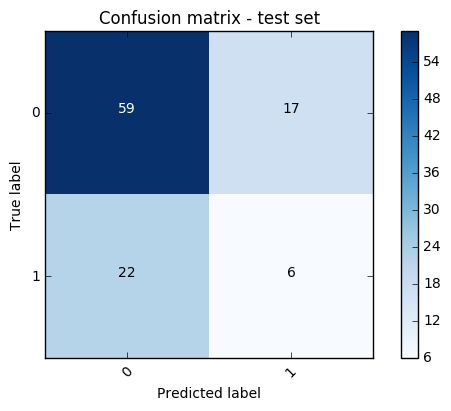

In [254]:
cutOff = 0.5
testCM = getCM(testLabelsSingle,testLogits,cutOff)

plot_confusion_matrix(testCM, classes=[0,1],
                      title='Confusion matrix - test set')
plt.show()

# PLOT CONV FEATURES FROM MODEL

# GET MODEL

In [2]:
# load json and create model
RUN="48"
json_file = open('/home/ahmed/Dropbox/DFCI/11_AWS_output/output/' + RUN + '_json.json', 'r')
loaded_model_json = json_file.read()
json_file.close()
myModel = model_from_json(loaded_model_json)
# load weights into new model
myModel.load_weights("/home/ahmed/Dropbox/DFCI/11_AWS_output/output/" + RUN + "_model.h5")

In [3]:
myModel.layers

In [4]:
# myModel.summary()

# get Filters - axial/Sag/Cor

In [5]:
def plotFilters(arr):
    fig = plt.figure(figsize=(60,20))
    for i in range (4):
        ax = fig.add_subplot(1,4,i+1)

        ax.imshow  ( arr[:,:,:,i].reshape(3,3) , cmap=plt.cm.binary, interpolation='none') # Greys_r)
        plt.axis('off')
        plt.tight_layout()

# filters

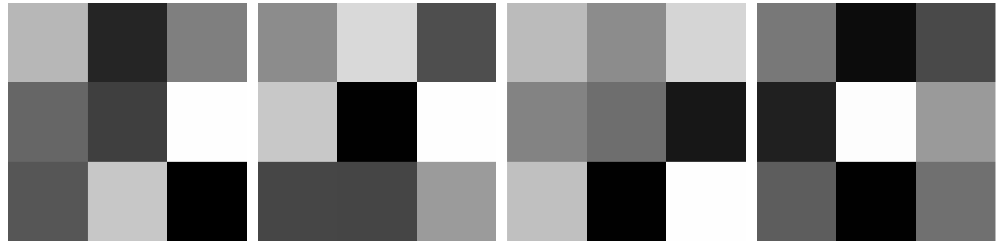

In [6]:
# get filters
# o is filers, 1 is bias vector
conv_1_a = myModel.layers[0]
plotFilters(conv_1_a.get_weights()[0])
#
# conv_1_s = myModel.layers[0].layers[2].layers[0].get_weights()
# plotFilters(conv_1_s[0])
# #
# conv_1_c = myModel.layers[0].layers[3].layers[0].get_weights()
# plotFilters(conv_1_c[0])

# input

In [88]:
sample = ["lung2_0012356" , "lung2_0041372" , "lung1_43062", 'lung1_43421' , 'lung1_43370','lung1_43392' ,'lung1_43402'] 
npy1 = '/home/ahmed/Dropbox/DFCI/kerasLungs/sample/' + sample[0] + '.npy'
arr1 = np.load(npy1)
arr1 = np.array(arr1,'float32')
#
npy2 = '/home/ahmed/Dropbox/DFCI/kerasLungs/sample/' + sample[1] + '.npy'
arr2 = np.load(npy2)
arr2 = np.array(arr2,'float32')


In [91]:
def centerAndNormalize(arr):
    out = arr
    #
    out -= 1000.0
    out /= 2000.0
    #
    return out


In [23]:
def centerAndStandardizeValTest(arr,mean,std):
    out = arr
    #
    out -= mean
    out /= (std + np.finfo(float).eps )
    #
    return out

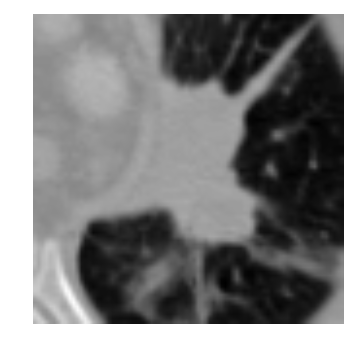

In [89]:
plt.imshow  ( arr1[75,35:115,35:115] , cmap=plt.cm.Greys_r)
plt.axis('off');

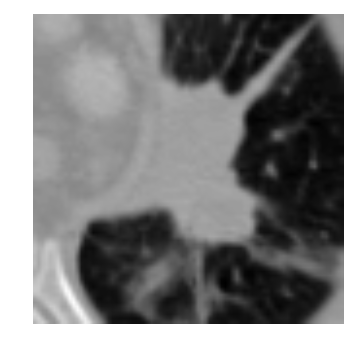

In [92]:
arr1new = centerAndNormalize(arr1)
plt.imshow  ( arr1new[75,35:115,35:115] , cmap=plt.cm.Greys_r)
plt.axis('off');

# normalized

-2.35245 3.42723


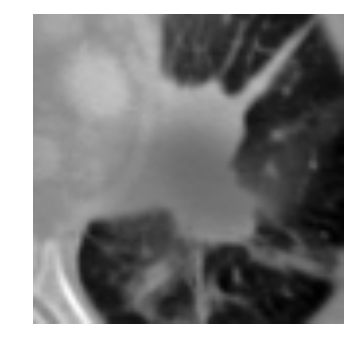

In [24]:
# mean and std
mean = np.load("/home/ahmed/Dropbox/DFCI/11_AWS_output/output/"+RUN+"_mean.npy")
std = np.load("/home/ahmed/Dropbox/DFCI/11_AWS_output/output/"+RUN+"_std.npy")

arr1 = centerAndStandardizeValTest( arr1 ,mean,std)
plt.imshow  ( arr1[75,35:115,35:115] , cmap=plt.cm.Greys_r)
plt.axis('off');
print arr1.min() , arr1.max()

In [26]:
arr1[0][0][:10]

array([ 0.58143252,  0.49737328,  0.67937523,  0.81522423,  0.79570448,
        0.73822242,  0.67064071,  0.65195066,  0.6261211 ,  0.58526152], dtype=float32)

In [27]:
arr1 += (arr1.min()*-1)
arr1[0][0][:10]

array([ 2.93388414,  2.84982491,  3.03182673,  3.16767573,  3.14815617,
        3.09067392,  3.02309227,  3.00440216,  2.97857261,  2.93771315], dtype=float32)

# convolution

In [28]:
output_fn = K.function( [conv_1_a.input] , [conv_1_a.output]  )

ins = np.array( [ arr1[75,35:115,35:115].reshape(80,80,1) ]  )
print ins.shape
outs = output_fn(  [ins] )
print outs[0].shape

(1, 80, 80, 1)
(1, 78, 78, 32)


<module 'matplotlib.pyplot' from '/home/ahmed/anaconda2/lib/python2.7/site-packages/matplotlib/pyplot.pyc'>

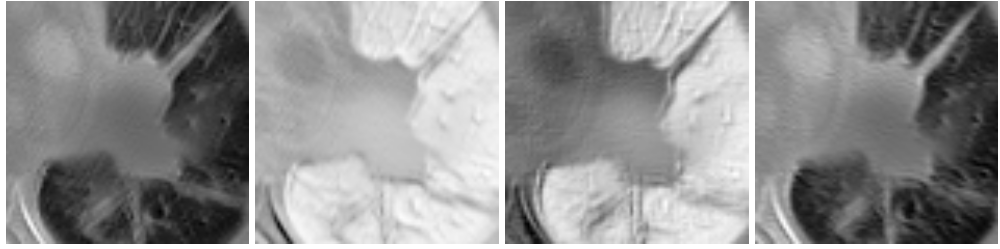

In [13]:
fig = plt.figure(figsize=(60,20))
for i in range (4):
    ax = fig.add_subplot(1,4,i+1)
    ax.imshow  ( outs[0][0,:,:,i] , cmap=plt.cm.Greys_r)
    plt.axis('off');
    plt.tight_layout()
plt


<module 'matplotlib.pyplot' from '/home/ahmed/anaconda2/lib/python2.7/site-packages/matplotlib/pyplot.pyc'>

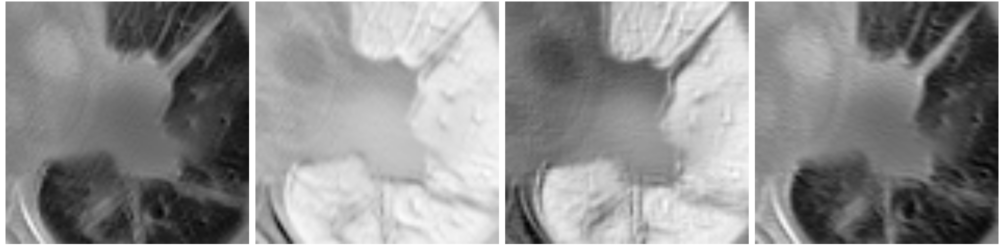

In [29]:
fig = plt.figure(figsize=(60,20))
for i in range (4):
    ax = fig.add_subplot(1,4,i+1)
    ax.imshow  ( outs[0][0,:,:,i] , cmap=plt.cm.Greys_r)
    plt.axis('off');
    plt.tight_layout()
plt

# batch normalization

(1, 80, 80, 1)
(1, 78, 78, 32)


<module 'matplotlib.pyplot' from '/home/ahmed/anaconda2/lib/python2.7/site-packages/matplotlib/pyplot.pyc'>

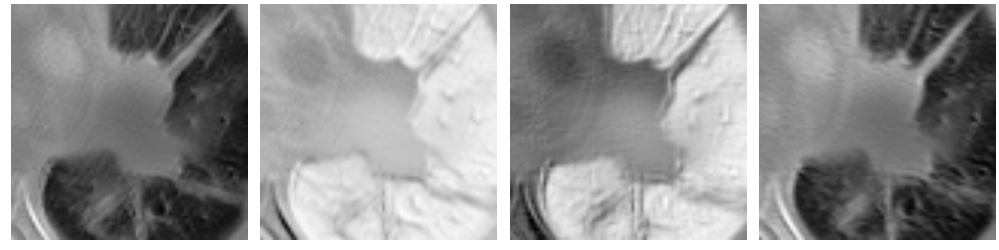

In [14]:
output_fn = K.function( [conv_1_a.input , K.learning_phase()] , [myModel.layers[1].output]  )
print ins.shape
outs = output_fn(  [ins , 0 ] )
print outs[0].shape
fig = plt.figure(figsize=(60,20))
for i in range (4):
    ax = fig.add_subplot(1,8,i+1)
    ax.imshow  ( outs[0][0,:,:,i] , cmap=plt.cm.Greys_r)
    plt.axis('off');
    plt.tight_layout()
plt

(1, 80, 80, 1)
(1, 78, 78, 32)


<module 'matplotlib.pyplot' from '/home/ahmed/anaconda2/lib/python2.7/site-packages/matplotlib/pyplot.pyc'>

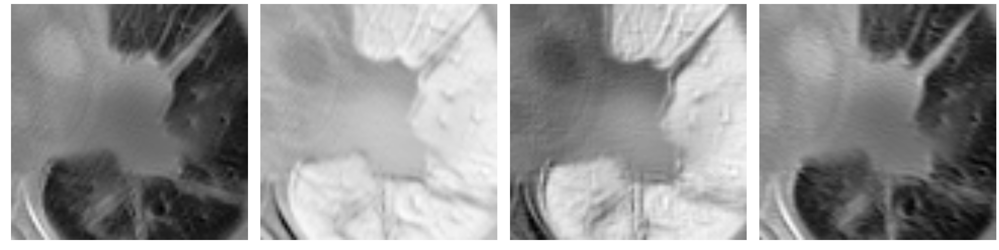

In [30]:
output_fn = K.function( [conv_1_a.input , K.learning_phase()] , [myModel.layers[1].output]  )
print ins.shape
outs = output_fn(  [ins , 0 ] )
print outs[0].shape
fig = plt.figure(figsize=(60,20))
for i in range (4):
    ax = fig.add_subplot(1,8,i+1)
    ax.imshow  ( outs[0][0,:,:,i] , cmap=plt.cm.Greys_r)
    plt.axis('off');
    plt.tight_layout()
plt

# relu activation

(1, 80, 80, 1)
(1, 78, 78, 32)


<module 'matplotlib.pyplot' from '/home/ahmed/anaconda2/lib/python2.7/site-packages/matplotlib/pyplot.pyc'>

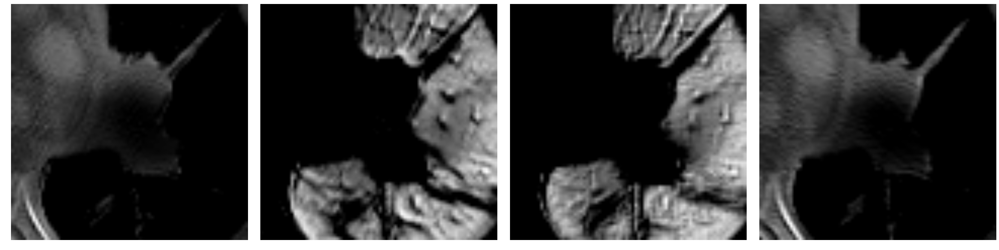

In [15]:
output_fn = K.function( [conv_1_a.input , K.learning_phase() ] , [myModel.layers[2].output]  )
print ins.shape
outs = output_fn(  [ins , 0] )
print outs[0].shape
fig = plt.figure(figsize=(60,20))
for i in range (4):
    ax = fig.add_subplot(1,8,i+1)
    ax.imshow  ( outs[0][0,:,:,i] , cmap=plt.cm.Greys_r)
    plt.axis('off');
    plt.tight_layout()
plt

(1, 80, 80, 1)
(1, 78, 78, 32)


<module 'matplotlib.pyplot' from '/home/ahmed/anaconda2/lib/python2.7/site-packages/matplotlib/pyplot.pyc'>

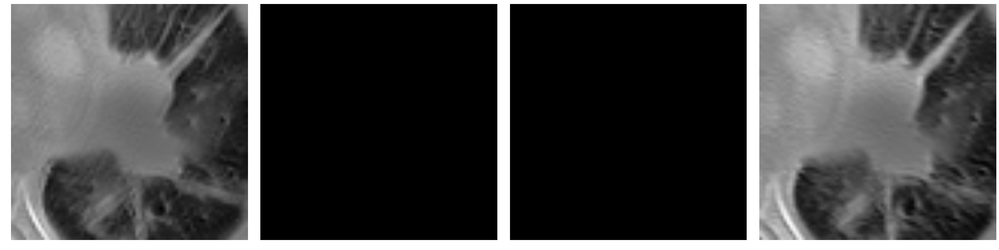

In [31]:
output_fn = K.function( [conv_1_a.input , K.learning_phase() ] , [myModel.layers[2].output]  )
print ins.shape
outs = output_fn(  [ins , 0] )
print outs[0].shape
fig = plt.figure(figsize=(60,20))
for i in range (4):
    ax = fig.add_subplot(1,8,i+1)
    ax.imshow  ( outs[0][0,:,:,i] , cmap=plt.cm.Greys_r)
    plt.axis('off');
    plt.tight_layout()
plt

# pooling

(1, 120, 120, 1)
(1, 39, 39, 32)


<module 'matplotlib.pyplot' from '/home/ahmed/anaconda2/lib/python2.7/site-packages/matplotlib/pyplot.pyc'>

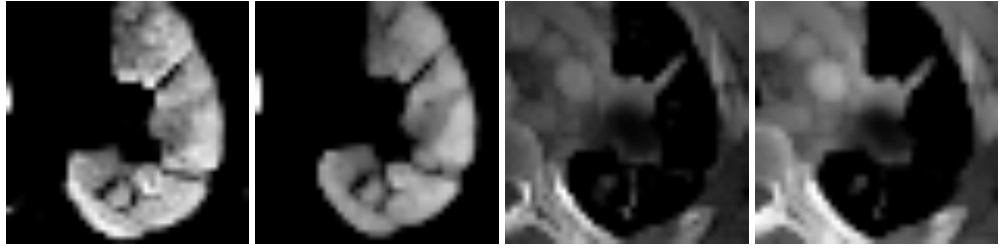

In [130]:
output_fn = K.function( [conv_1_a.input , K.learning_phase() ] , [myModel.layers[3].output]  )
print ins.shape
outs = output_fn(  [ins , 0] )
print outs[0].shape
fig = plt.figure(figsize=(60,20))
for i in range (4):
    ax = fig.add_subplot(1,4,i+1)
    ax.imshow  ( outs[0][0,:,:,i] , cmap=plt.cm.Greys_r)
    plt.axis('off');
    plt.tight_layout()
plt

# dropout

(1, 120, 120, 1)
(1, 39, 39, 32)


<module 'matplotlib.pyplot' from '/home/ahmed/anaconda2/lib/python2.7/site-packages/matplotlib/pyplot.pyc'>

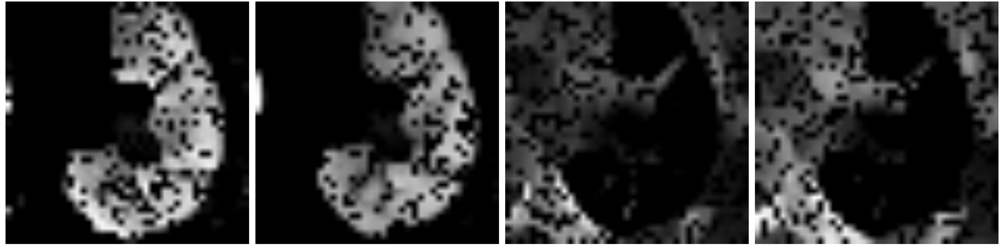

In [132]:
output_fn = K.function( [conv_1_a.input , K.learning_phase()  ] , [myModel.layers[4].output]  )
print ins.shape
outs = output_fn(  [ins , 1] )
print outs[0].shape
fig = plt.figure(figsize=(60,20))
for i in range (4):
    ax = fig.add_subplot(1,4,i+1)
    ax.imshow  ( outs[0][0,:,:,i] , cmap=plt.cm.Greys_r)
    plt.axis('off');
    plt.tight_layout()
plt

In [ ]:
# get only death by disease
# all patients with cause of death 1
# diseaseDeath = np.load("/home/ahmed/Dropbox/DFCI/kerasLungs/rt_diseaseDeath.npy").astype(str)
# dataFrameTest0 = dataFrameTest[ dataFrameTest['deadstat'] == 0.0 ]
# dataFrameTest1 = dataFrameTest[ dataFrameTest['deadstat'] == 1.0 ]
# dataFrameTest1_1 = dataFrameTest1 [ dataFrameTest1["patient"].isin(diseaseDeath) ]
# dataFrameTest = pd.concat([dataFrameTest0,dataFrameTest1_1],axis=0)
# dataFrameTest = dataFrameTest.reset_index(drop=True)
# print dataFrameTest.shape

# test LR

In [3]:
lrList = [0.1,0.01,0.001,0.0001,0.00001,0.000001,0.000005,0.0000001,0.0000005,0.00000001 ]

In [4]:
lista = [0.1,0.01,0.001,0.0001,1e-05,1e-06, 5e-06 ]
data = []
boola = "False"
for i in iter(lista):
    seq = np.load("/home/ahmed/Dropbox/DFCI/11_AWS_output/output/tests/" 
                  + str(i) + "_" + boola + "_train_loss.npy").tolist()
    scatter = go.Scatter( x=np.arange(len(seq)), y=seq, 
                      showlegend=True ,line=dict(width=1), name = "lr=" + str(i) )
    data.append(scatter)
    
layout = go.Layout(
    title = "augmentation=" + boola,
    xaxis=dict(
        showgrid=True,
        zeroline=True,
        showline=True,
        showticklabels=True,
        title="epochs"
      
    ),
    yaxis=dict(
        showgrid=True,
        zeroline=True,
        showline=True,
        showticklabels=True,
        title="value",
        range=[0, 5]
    ),
    autosize=True,
    showlegend=True,
)

fig = go.Figure(data=data, layout=layout)
iplot(fig, filename="run # " ,  ) # image='svg'

In [9]:
lista = [0.1,0.01,0.001,0.0001,1e-05,1e-06, 5e-06  ] # 0.1,0.01,
data = []
boola = "True"
for i in iter(lista):
    seq = np.load("/home/ahmed/Dropbox/DFCI/11_AWS_output/output/tests/" 
                  + str(i) + "_" + boola + "_train_loss.npy").tolist()
    scatter = go.Scatter( x=np.arange(len(seq)), y=seq, 
                      showlegend=True ,line=dict(width=1), name = "lr=" + str(i) )
    data.append(scatter)
    
layout = go.Layout(
    title = "augmentation=" + boola,
    xaxis=dict(
        showgrid=True,
        zeroline=True,
        showline=True,
        showticklabels=True,
        title="epochs",
        range=[0, 200]
      
    ),
    yaxis=dict(
        showgrid=True,
        zeroline=True,
        showline=True,
        showticklabels=True,
        title="value",
        range=[0, 0.6]
    ),
    autosize=True,
    showlegend=True,
)

fig = go.Figure(data=data, layout=layout)
iplot(fig, filename="run # " ,  ) # image='svg'